# Fast RCNN

Faster RCNN (Region-CNN) is an object detection technique that has achieved state-of-the-art performance on various benchmarks. It is based on the R-CNN and SPP-Net approaches and extends them by integrating the faster convolutional networks (CNNs) framework.

#### - <em>Faster RCNN is a two-stage detector:</em>

1. Proposal stage: A set of regions is proposed based on selective search or a CNN network.
2. Classification stage: For each region, the class and the bounding box coordinates are predicted.

#### - <em>Faster RCNN's advantages:</em>

- Faster detection speed compared to previous object detection techniques.
Capable of processing large images.
- State-of-the-art accuracy on object detection benchmarks.

#### - <em>Faster RCNN's limitations:</em>

- Computationally expensive due to its complex operations.
- Training process can be slow, requiring multiple GPUs.
- Fine-tuning of hyperparameters can be challenging.

**Source**: Well explained Fast RCNN architecture in this blog:
[paperspace.com](https://blog.paperspace.com/faster-r-cnn-explained-object-detection/)

# -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- --
## Training setup

### 1. GPU memory usage
Run this code lines to check CUDA and GPU memory availabilty

In [1]:
!nvidia-smi

Sat Jan  6 12:51:07 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA RTX A6000               On  | 00000000:19:00.0 Off |                  Off |
| 30%   37C    P8              24W / 300W |     12MiB / 49140MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
# Check CUDA compiler
!nvcc -V

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0


### <em>Optional</em>
If you'd like to use a base a pretrained Faster RCNN, you can uncomment the following line code

and change `load_from` variable in the config file [faster-rcnn_hrplanesv2.py](./mmlab_configs/faster-rcnn_hrplanesv2.py) from `None` to the path of the downloaded `.pth`

In [ ]:
# !mim download mmdet --config faster-rcnn_r50-caffe_fpn_1x_coco --dest mmlab_configs

### Start training

you can start training Faster RCNN using this command line

In [ ]:
!python train.py mmlab_configs/faster-rcnn_hrplanesv2.py

### Wait until the training finishes
if the training takes too long you can use in the terminal the command:

 ```nohup python train.py mmlab_configs/faster-rcnn_hrplanesv2.py > faster-rcnn_hrplanesv2.log &```

### Inference
To run the inference, execute the following command

In [4]:
!python image_inference.py inference_test/unseen output_tensor/faster-rcnn/faster-rcnn_hrplanesv2.py --weights output_tensor/faster-rcnn/best.pth --out-dir inference_test/results/fasterrcnn_inference --pred-score-thr 0.3

Loads checkpoint by local backend from path: output_tensor/faster-rcnn/best.pth
01/06 13:29:11 - mmengine - WARNING - Failed to search registry with scope "mmdet" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmdet" is a correct scope, or whether the registry is initialized.
01/06 13:29:11 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
/home/safouane/.local/lib/python3.8/site-packages/mmengine/visualization/visuali━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1 it/s  
zer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may 
not be in the image
  warnings.warn(
/home/safouane/.local/lib/python3.8/site-packages/mmengine/visualization/visualim━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1 it/s  
zer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn 
polygon may

### Let's plot the results

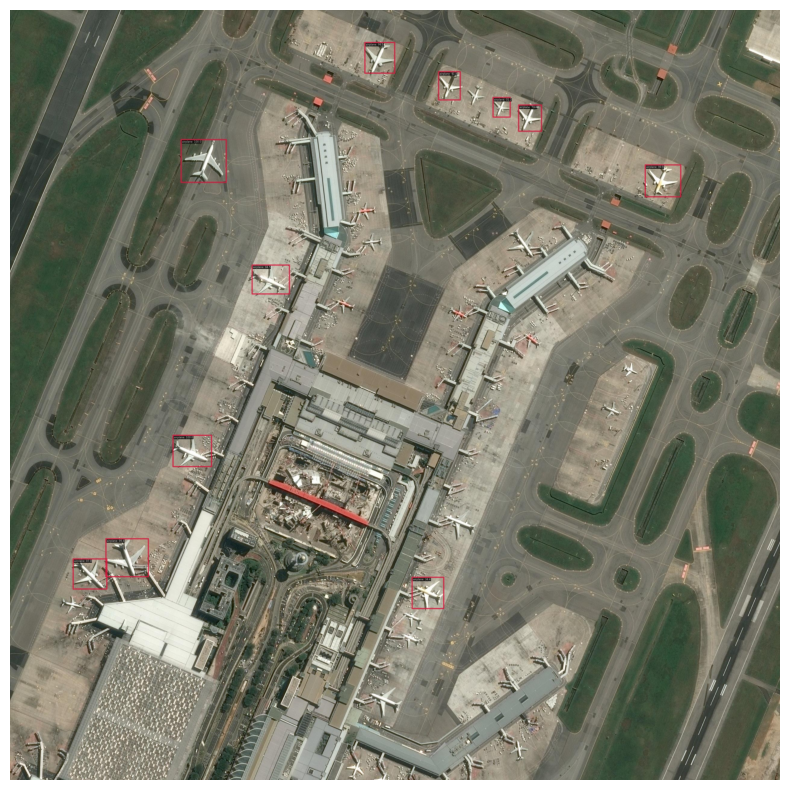

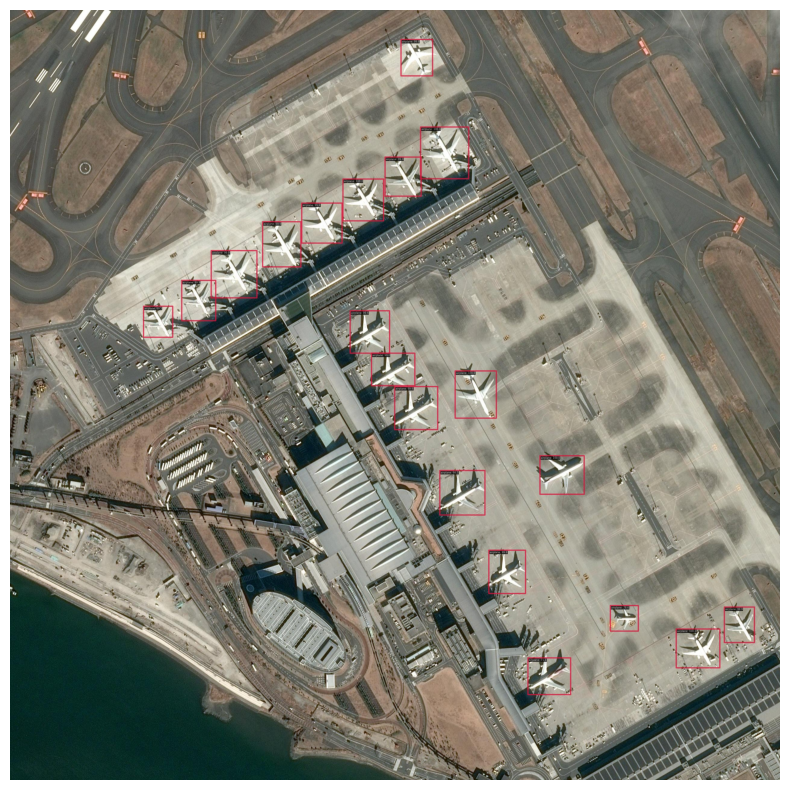

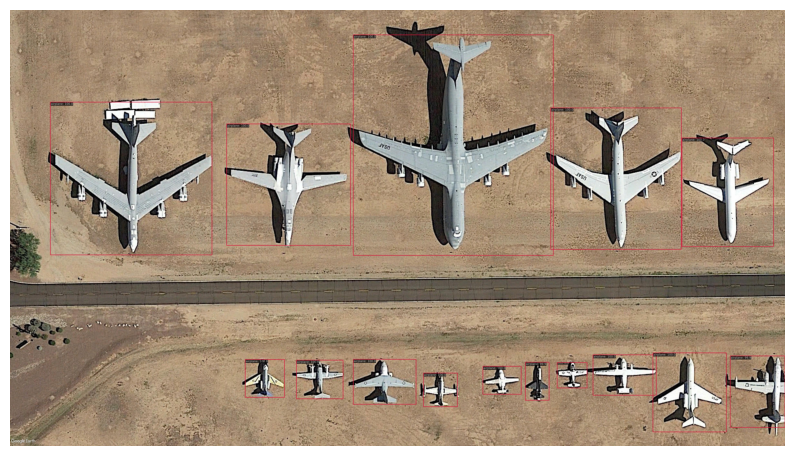

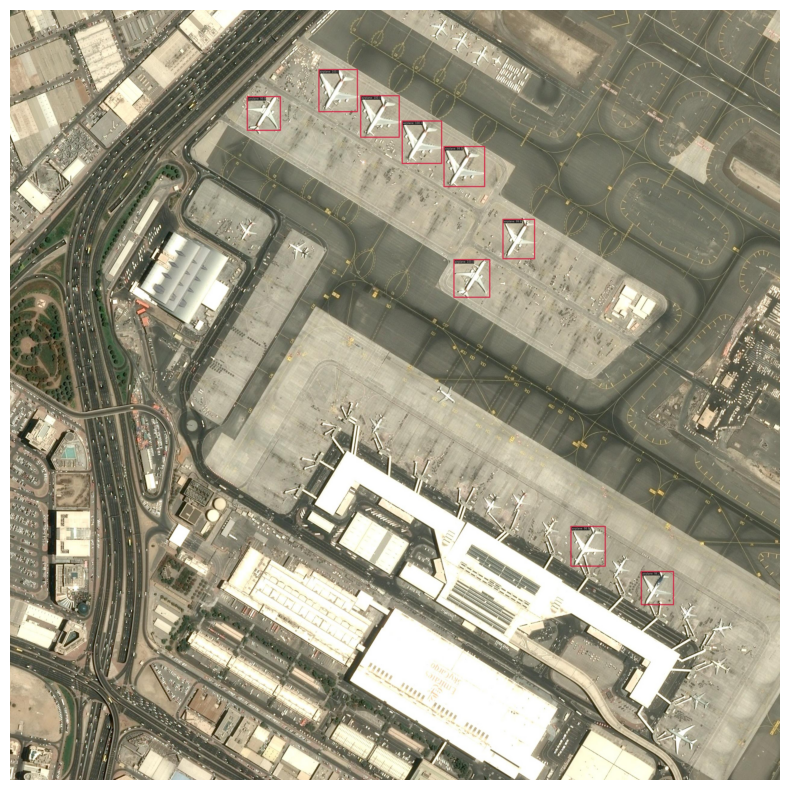

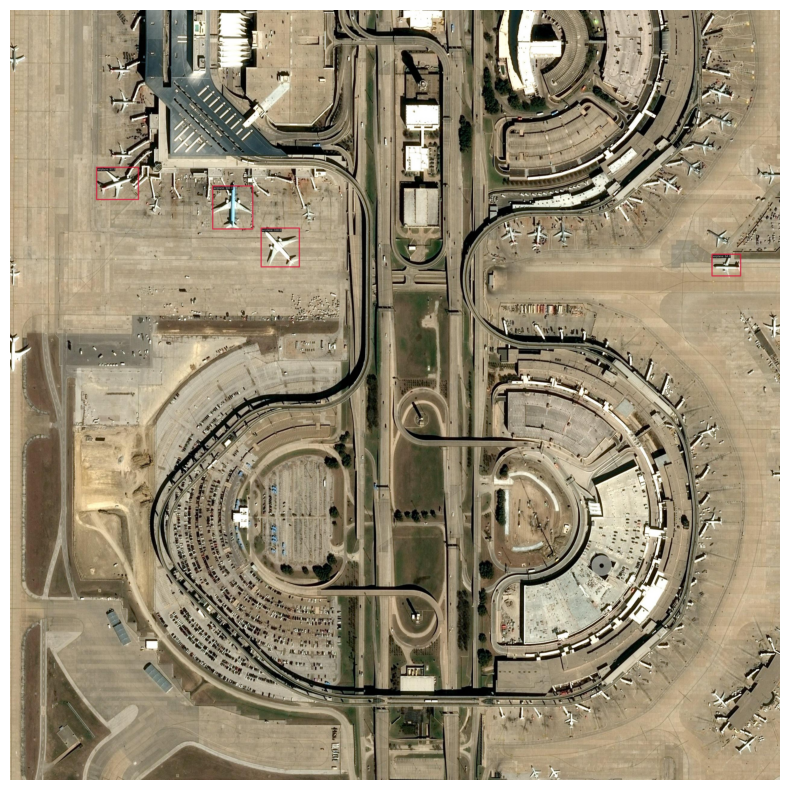

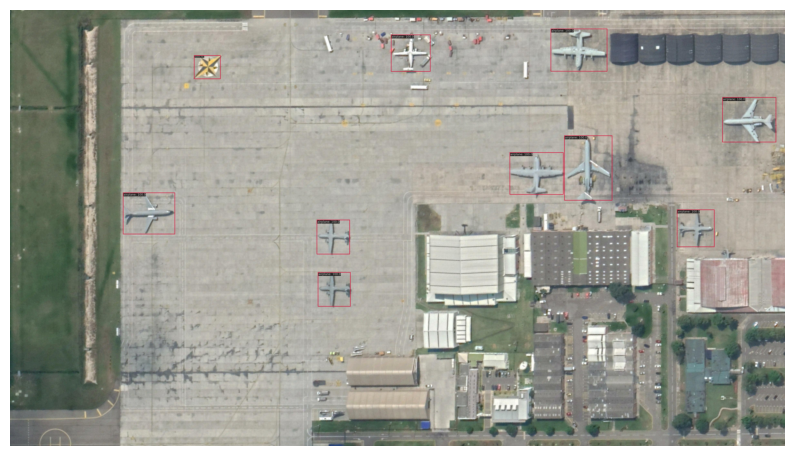

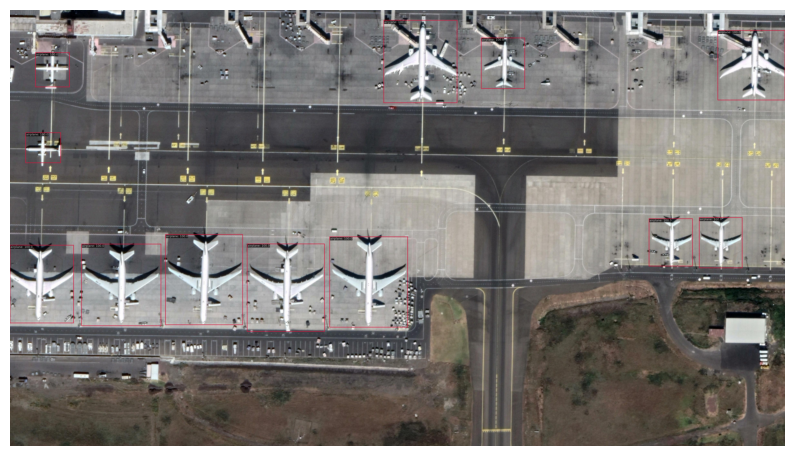

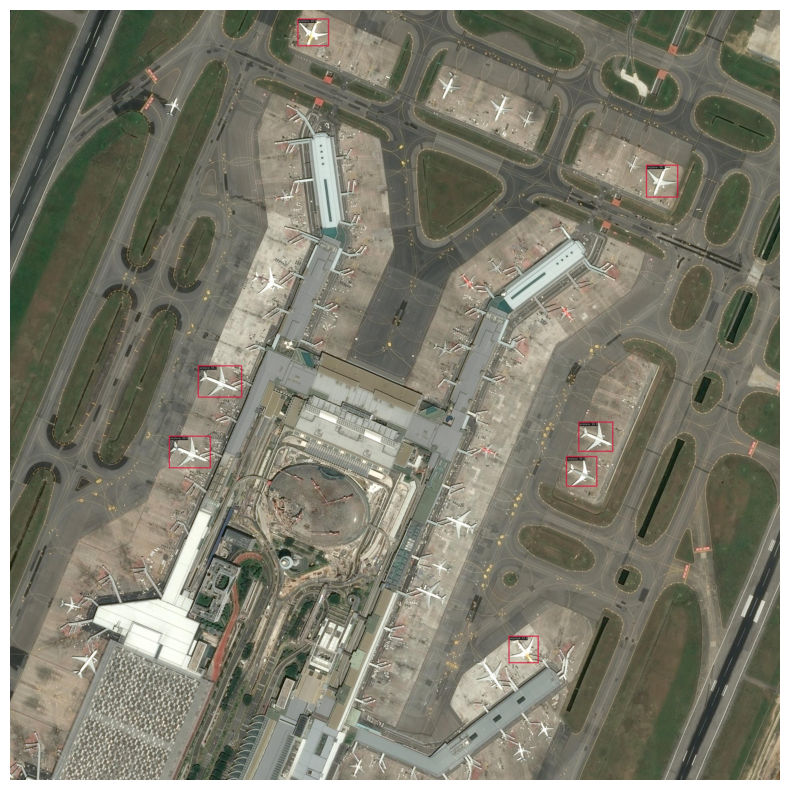

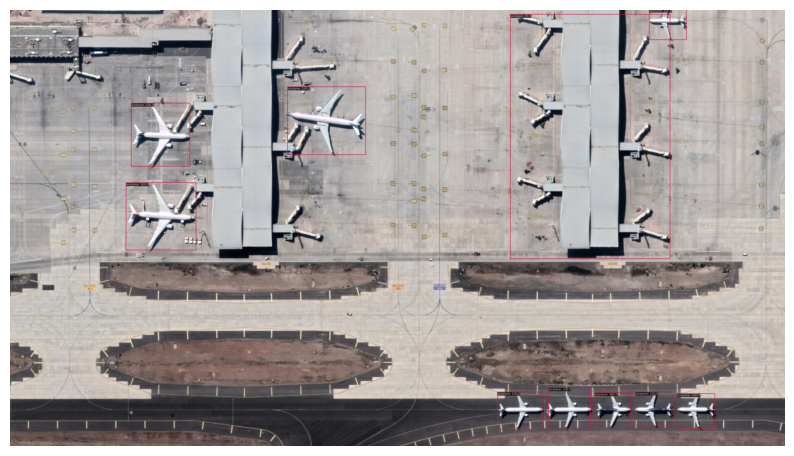

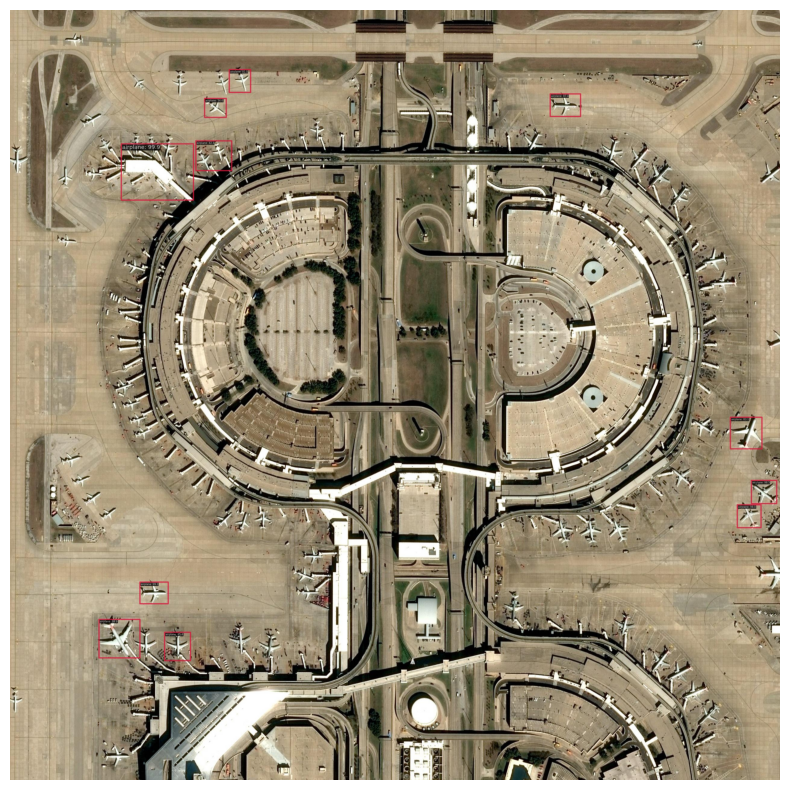

In [6]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define the path to the directory containing the jpg images
path_to_images = './inference_test/results/fasterrcnn_inference/vis'

# Iterate over each file in the directory
for file in os.listdir(path_to_images):
    # Check if the file is a jpg image
    if file.endswith('.jpg'):
        # Open the image using PIL
        img = Image.open(os.path.join(path_to_images, file))

        # Convert the image to an RGB format that matplotlib can understand
        img_rgb = img.convert('RGB')

        # Display the image using matplotlib
        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.axis('off')
        plt.show()

### Inference Test on video

In [1]:
!python video_inference.py inference_test/videos/Barcelona_airport.mp4 output_tensor/faster-rcnn/faster-rcnn_hrplanesv2.py output_tensor/faster-rcnn/best.pth --out inference_test/videos/Barcelona_airport_FasterRCNN_inference.mp4

Loads checkpoint by local backend from path: output_tensor/faster-rcnn/best.pth
01/11 14:53:59 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[>>                              ] 40/449, 5.0 task/s, elapsed: 8s, ETA:    82s/home/safouane/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/home/safouane/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 449/449, 6.5 task/s, elapsed: 70s, ETA:     0s


In [2]:
!python /home/safouane/Downloads/FlightScope_Bench/algorithms/mmdetection/demo/video_demo.py inference_test/videos/Barcelona_airport.mp4 output_tensor/faster-rcnn/faster-rcnn_hrplanesv2.py output_tensor/faster-rcnn/best.pth --out inference_test/videos/Barcelona_airport_FasterRCNN_inference_.mp4

Loads checkpoint by local backend from path: output_tensor/faster-rcnn/best.pth
01/22 17:45:23 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[>>                              ] 40/449, 6.1 task/s, elapsed: 7s, ETA:    67s/home/safouane/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/home/safouane/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 449/449, 7.5 task/s, elapsed: 60s, ETA:     0s
